# Regression & Classification, Module 1

### LSDS 212 - Assignment

*Unit 2, Sprint 1, Module 2*

Lambda School Data Science, Unit 2: Predictive Modeling

---
---

# Regression & Classification, Module 2

## Assignment

You'll continue to **predict how much it costs to rent an apartment in NYC,** using the dataset from renthop.com.

- [x] Do train/test split. Use data from April & May 2016 to train. Use data from June 2016 to test.
- [x] Engineer at least two new features. (See below for explanation & ideas.)
- [x] Fit a linear regression model with at least two features.
- [x] Get the model's coefficients and intercept.
- [x] Get regression metrics RMSE, MAE, and $R^2$, for both the train and test data.
- [ ] What's the best test MAE you can get? Share your score and features used with your cohort on Slack!
- [ ] As always, commit your notebook to your fork of the GitHub repo.

#### [Feature Engineering](https://en.wikipedia.org/wiki/Feature_engineering)

> "Some machine learning projects succeed and some fail. What makes the difference? Easily the most important factor is the features used." — Pedro Domingos, ["A Few Useful Things to Know about Machine Learning"](https://homes.cs.washington.edu/~pedrod/papers/cacm12.pdf)

> "Coming up with features is difficult, time-consuming, requires expert knowledge. 'Applied machine learning' is basically feature engineering." — Andrew Ng, [Machine Learning and AI via Brain simulations](https://forum.stanford.edu/events/2011/2011slides/plenary/2011plenaryNg.pdf) 

> Feature engineering is the process of using domain knowledge of the data to create features that make machine learning algorithms work. 

#### Feature Ideas
- Does the apartment have a description?
- How long is the description?
- How many total perks does each apartment have?
- Are cats _or_ dogs allowed?
- Are cats _and_ dogs allowed?
- Total number of rooms (beds + baths)
- Ratio of beds to baths
- What's the neighborhood, based on address or latitude & longitude?

---

## Stretch Goals
- [ ] If you want more math, skim [_An Introduction to Statistical Learning_](http://faculty.marshall.usc.edu/gareth-james/ISL/ISLR%20Seventh%20Printing.pdf)
  - Chapter 3.1, Simple Linear Regression
  - Chapter 3.2, Multiple Linear Regression
- [ ] If you want more introduction, watch [Brandon Foltz, Statistics 101: Simple Linear Regression](https://www.youtube.com/watch?v=ZkjP5RJLQF4)
(20 minutes, over 1 million views)
- [ ] Add your own stretch goal(s) !

---
---

### Imports

In [1]:
import numpy as np
import pandas as pd

In [121]:
# scikit-learn imports
from sklearn.metrics import mean_absolute_error
from sklearn.linear_model import LinearRegression
# metrics
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [2]:
# Ignore this Numpy warning when using Plotly Express:
# FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
import warnings
warnings.filterwarnings(action='ignore', category=FutureWarning, module='numpy')

In [3]:
import plotly.express as px
import plotly.offline as pyo
import plotly.graph_objs as go

### Config

In [4]:
# Set notebook mode to work in offline
pyo.init_notebook_mode()

In [5]:
# Set pandas display options to allow for more columns and rows
pd.set_option("display.max_columns", 100)
pd.set_option("display.max_rows", 500)

---

In [44]:
# Read New York City apartment rental listing data
df = pd.read_csv('../data/apartments/renthop-nyc.csv')
assert df.shape == (49352, 34)

# Remove the most extreme 1% prices, .1% latitudes, & .1% longitudes
df = df[(df['price'] >= np.percentile(df['price'], 0.5)) & 
        (df['price'] <= np.percentile(df['price'], 99.5)) & 
        (df['latitude'] >= np.percentile(df['latitude'], 0.05)) & 
        (df['latitude'] < np.percentile(df['latitude'], 99.95)) &
        (df['longitude'] >= np.percentile(df['longitude'], 0.05)) & 
        (df['longitude'] <= np.percentile(df['longitude'], 99.95))]

---
---

#### 1. Do train/test split. 

- Use data from April & May 2016 to train. 
- Use data from June 2016 to test.

In [45]:
df.head(2)

,bathrooms,bedrooms,created,description,display_address,latitude,longitude,price,street_address,interest_level,elevator,cats_allowed,hardwood_floors,dogs_allowed,doorman,dishwasher,no_fee,laundry_in_building,fitness_center,pre-war,laundry_in_unit,roof_deck,outdoor_space,dining_room,high_speed_internet,balcony,swimming_pool,new_construction,terrace,exclusive,loft,garden_patio,wheelchair_access,common_outdoor_space
0,1.5,3,2016-06-24 07:54:24,A Brand New 3 Bedroom 1.5 bath ApartmentEnjoy ...,Metropolitan Avenue,40.7145,-73.9425,3000,792 Metropolitan Avenue,medium,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1.0,2,2016-06-12 12:19:27,,Columbus Avenue,40.7947,-73.9667,5465,808 Columbus Avenue,low,1,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [46]:
# In order to split based on the "created" I need to be sure it's a datetime column
df.dtypes

bathrooms               float64
bedrooms                  int64
created                  object
description              object
display_address          object
latitude                float64
longitude               float64
price                     int64
street_address           object
interest_level           object
elevator                  int64
cats_allowed              int64
hardwood_floors           int64
dogs_allowed              int64
doorman                   int64
dishwasher                int64
no_fee                    int64
laundry_in_building       int64
fitness_center            int64
pre-war                   int64
laundry_in_unit           int64
roof_deck                 int64
outdoor_space             int64
dining_room               int64
high_speed_internet       int64
balcony                   int64
swimming_pool             int64
new_construction          int64
terrace                   int64
exclusive                 int64
loft                      int64
garden_p

In [47]:
# Convert "created" to datetime using pandas
df["created"] = pd.to_datetime(df["created"], infer_datetime_format=True)
df["created"].head()

0   2016-06-24 07:54:24
1   2016-06-12 12:19:27
2   2016-04-17 03:26:41
3   2016-04-18 02:22:02
4   2016-04-28 01:32:41
Name: created, dtype: datetime64[ns]

In [48]:
df.dtypes

bathrooms                      float64
bedrooms                         int64
created                 datetime64[ns]
description                     object
display_address                 object
latitude                       float64
longitude                      float64
price                            int64
street_address                  object
interest_level                  object
elevator                         int64
cats_allowed                     int64
hardwood_floors                  int64
dogs_allowed                     int64
doorman                          int64
dishwasher                       int64
no_fee                           int64
laundry_in_building              int64
fitness_center                   int64
pre-war                          int64
laundry_in_unit                  int64
roof_deck                        int64
outdoor_space                    int64
dining_room                      int64
high_speed_internet              int64
balcony                  

In [49]:
df["created"].describe()  # Note sure why this gives a datatype of "object"

count                   48817
unique                  48148
top       2016-05-14 01:11:03
freq                        3
first     2016-04-01 22:12:41
last      2016-06-29 21:41:47
Name: created, dtype: object

In [50]:
# Now the dataset is ready to split up the dataset based on that column

# Train should be 2016-04 - 2016-05
train = df[df["created"].dt.month <= 5]

# Test should be 2016-06
test = df[df["created"].dt.month == 6]

In [51]:
# Take a look at the sizes - about 30% is test
len(train), len(test)

(31844, 16973)

---

#### 2. Engineer at least two new features.

Ideas:

- Ratio of bathrooms/bedrooms
- Time of day it was created
- Perks
  - Total perks
- Description
  - Length of description
  - Ratio of capital/lowercase letters

In [53]:
df.head()

,bathrooms,bedrooms,created,description,display_address,latitude,longitude,price,street_address,interest_level,elevator,cats_allowed,hardwood_floors,dogs_allowed,doorman,dishwasher,no_fee,laundry_in_building,fitness_center,pre-war,laundry_in_unit,roof_deck,outdoor_space,dining_room,high_speed_internet,balcony,swimming_pool,new_construction,terrace,exclusive,loft,garden_patio,wheelchair_access,common_outdoor_space
0,1.5,3,2016-06-24 07:54:24,A Brand New 3 Bedroom 1.5 bath ApartmentEnjoy ...,Metropolitan Avenue,40.7145,-73.9425,3000,792 Metropolitan Avenue,medium,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1.0,2,2016-06-12 12:19:27,,Columbus Avenue,40.7947,-73.9667,5465,808 Columbus Avenue,low,1,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1.0,1,2016-04-17 03:26:41,"Top Top West Village location, beautiful Pre-w...",W 13 Street,40.7388,-74.0018,2850,241 W 13 Street,high,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1.0,1,2016-04-18 02:22:02,Building Amenities - Garage - Garden - fitness...,East 49th Street,40.7539,-73.9677,3275,333 East 49th Street,low,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1.0,4,2016-04-28 01:32:41,Beautifully renovated 3 bedroom flex 4 bedroom...,West 143rd Street,40.8241,-73.9493,3350,500 West 143rd Street,low,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


#### 1.1 "created" - Time of Day

> *Creating features with overall dataset, then splitting again into train / test.*

In [54]:
# Extract the hour of the day from the "created" column
df["created_hour"] = df["created"].dt.hour

In [55]:
df[["created","created_hour"]].tail()

,created,created_hour
49347,2016-06-02 05:41:05,5
49348,2016-04-04 18:22:34,18
49349,2016-04-16 02:13:40,2
49350,2016-04-08 02:13:33,2
49351,2016-04-12 02:48:07,2


To make this a little more useful, I'm going to bucket the hours into on and off hours.

- Business hours: 8 - 17
- Not during business hours = 0
- During business hours = 1


In [56]:
# Write function for determining if created during business hours
def business_hours(cell):
    """
    Returns 1 if given hour is between the hours of 8am and 5pm (inclusive).
    """
    return 1 if 8 <= cell <= 17 else 0 

In [58]:
# Apply the business_hours function to create new feature
# 1 = created during business hours
df["created_biz_hours"] = df["created_hour"].apply(business_hours)

In [65]:
# Very surprised with how rarely they are created during business hours
# Only 3 in 60
df[["created_hour", "created_biz_hours"]].head(60)

,created_hour,created_biz_hours
0,7,0
1,12,1
2,3,0
3,2,0
4,1,0
5,4,0
6,3,0
7,6,0
8,2,0
9,2,0


In [66]:
# I'm curious to see what the actual numbers are for the during business hours feature
df["created_biz_hours"].describe()  # Mean is less than 0.1! Less than 10% are during business hours

count    48817.000000
mean         0.098163
std          0.297537
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: created_biz_hours, dtype: float64

#### 1.2 "description" - Ratio of capital to lowercase letters

In [81]:
# Write a function that calculates the ratio of capital/lowercase

def capitalization_ratio(string):
    """
    Calculates the ratio of capital to lowercase letters in a given string.
    """
    cap = sum(1 for l in string if l.isupper())
    total = len(string)
    return round(cap / total, 6)

In [82]:
string = "Here's one way. I need LOTS OF capital LETTERS!"

capitalization_ratio(string)

0.319149

In [83]:
# Testing it out on string with lots of spaces
string2 = "             "

capitalization_ratio(string2)  # Returns 0 - that works

0.0

In [80]:
# Check datatype of description column
df.dtypes

bathrooms                      float64
bedrooms                         int64
created                 datetime64[ns]
description                     object
display_address                 object
latitude                       float64
longitude                      float64
price                            int64
street_address                  object
interest_level                  object
elevator                         int64
cats_allowed                     int64
hardwood_floors                  int64
dogs_allowed                     int64
doorman                          int64
dishwasher                       int64
no_fee                           int64
laundry_in_building              int64
fitness_center                   int64
pre-war                          int64
laundry_in_unit                  int64
roof_deck                        int64
outdoor_space                    int64
dining_room                      int64
high_speed_internet              int64
balcony                  

In [84]:
# Apply the capitalization ratio function to create new feature
df["desc_cap_ratio"] = df["description"].apply(capitalization_ratio)

TypeError: 'float' object is not iterable

In [85]:
# Still giving me an error stating that it's inputting a float value
df["description"] = df["description"].astype("str")

In [86]:
# Try again to create the new feature
df["desc_cap_ratio"] = df["description"].apply(capitalization_ratio)

In [87]:
df["desc_cap_ratio"]  # That seemed to have worked as expected

0        0.103741
1        0.000000
2        0.026049
3        0.048780
4        0.025052
           ...   
49347    0.106734
49348    0.032889
49349    0.081967
49350    0.019048
49351    0.038798
Name: desc_cap_ratio, Length: 48817, dtype: float64

---

> Split up the data now that the new features have been created

In [88]:
# Train should be 2016-04 - 2016-05
train = df[df["created"].dt.month <= 5]

# Test should be 2016-06
test = df[df["created"].dt.month == 6]

In [89]:
# Take a look at the sizes - about 30% is test
len(train), len(test)

(31844, 16973)

### Plot New Features

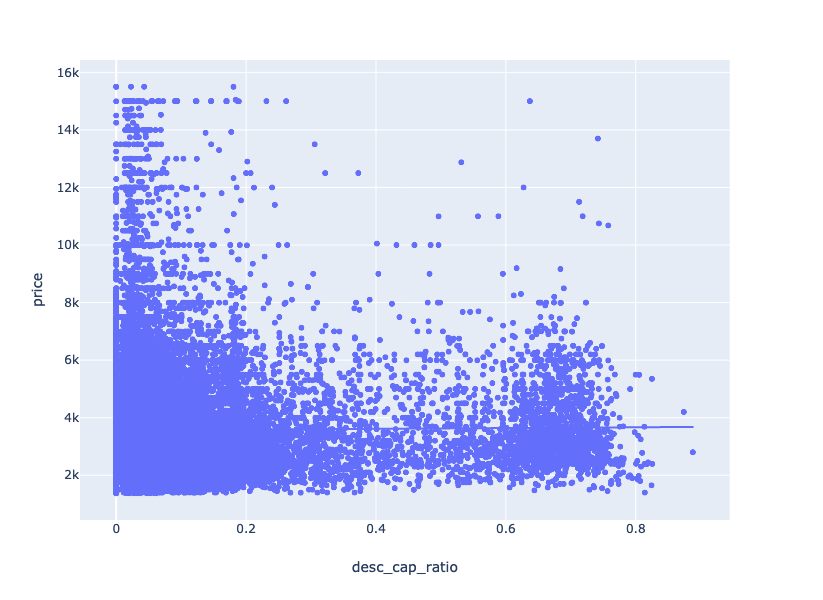

In [111]:
# Plot the capitalization ratio
px.scatter(train, x="desc_cap_ratio", y="price", trendline="ols")

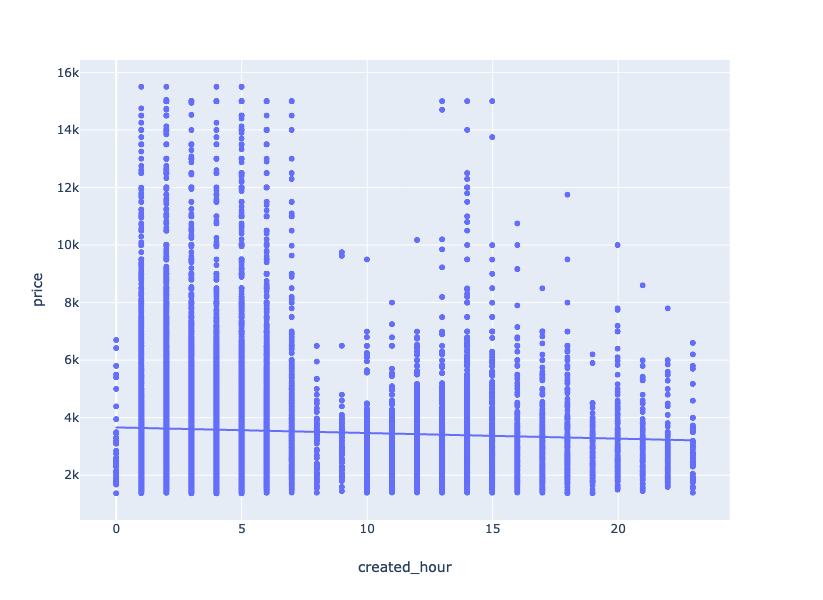

In [112]:
# Plot the hour of day
px.scatter(train, x="created_hour", y="price", trendline="ols")

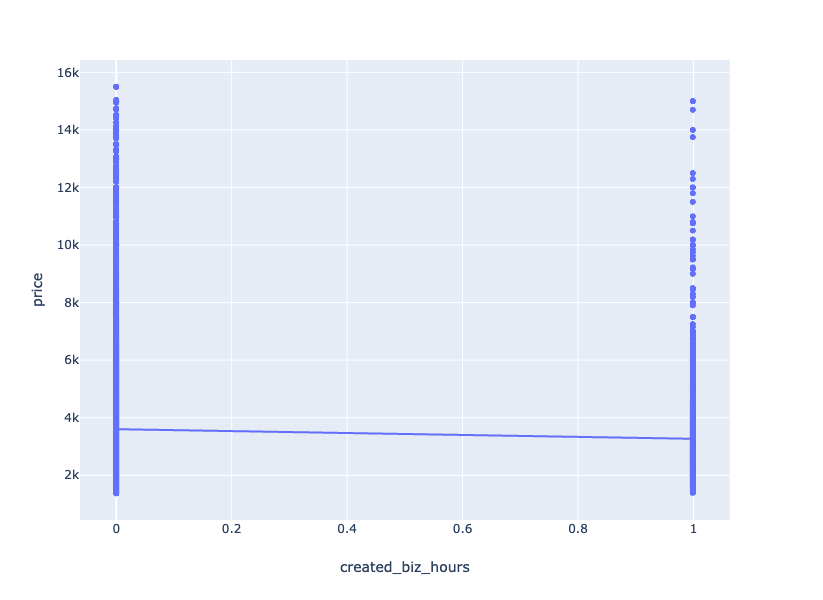

In [113]:
# Plot the during business hours
px.scatter(train, x="created_biz_hours", y="price", trendline="ols")

In [117]:
# Plot all three new ones
px.scatter_3d(train, x="desc_cap_ratio", y="price", z="created_hour", color="created_biz_hours")

In [118]:
import itertools

def regression_3d(df, x, y, z, num=100, **kwargs):
    """
    Visualize linear regression in 3D: 2 features + 1 target
    
    df : Pandas DataFrame
    x : string, feature 1 column in df
    y : string, feature 2 column in df
    z : string, target column in df
    num : integer, number of quantiles for each feature
    """
    
    # Plot data
    fig = px.scatter_3d(df, x, y, z, **kwargs)
    
    # Fit Linear Regression
    features = [x, y]
    target = z
    model = LinearRegression()
    model.fit(df[features], df[target])    
    
    # Define grid of coordinates in the feature space
    xmin, xmax = df[x].min(), df[x].max()
    ymin, ymax = df[y].min(), df[y].max()
    xcoords = np.linspace(xmin, xmax, num)
    ycoords = np.linspace(ymin, ymax, num)
    coords = list(itertools.product(xcoords, ycoords))
    
    # Make predictions for the grid
    predictions = model.predict(coords)
    Z = predictions.reshape(num, num).T
    
    # Plot predictions as a 3D surface (plane)
    fig.add_trace(go.Surface(x=xcoords, y=ycoords, z=Z))
    
    return fig

In [120]:
regression_3d(
    train,
    x="desc_cap_ratio",
    z="price",
    y="created_hour",
    color="created_biz_hours"
)

---

#### 3. Fit a linear regression model with at least two features.

In [91]:
df.head()

,bathrooms,bedrooms,created,description,display_address,latitude,longitude,price,street_address,interest_level,elevator,cats_allowed,hardwood_floors,dogs_allowed,doorman,dishwasher,no_fee,laundry_in_building,fitness_center,pre-war,laundry_in_unit,roof_deck,outdoor_space,dining_room,high_speed_internet,balcony,swimming_pool,new_construction,terrace,exclusive,loft,garden_patio,wheelchair_access,common_outdoor_space,created_hour,created_biz_hours,desc_cap_ratio
0,1.5,3,2016-06-24 07:54:24,A Brand New 3 Bedroom 1.5 bath ApartmentEnjoy ...,Metropolitan Avenue,40.7145,-73.9425,3000,792 Metropolitan Avenue,medium,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,7,0,0.103741
1,1.0,2,2016-06-12 12:19:27,,Columbus Avenue,40.7947,-73.9667,5465,808 Columbus Avenue,low,1,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,12,1,0.000000
2,1.0,1,2016-04-17 03:26:41,"Top Top West Village location, beautiful Pre-w...",W 13 Street,40.7388,-74.0018,2850,241 W 13 Street,high,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0.026049
3,1.0,1,2016-04-18 02:22:02,Building Amenities - Garage - Garden - fitness...,East 49th Street,40.7539,-73.9677,3275,333 East 49th Street,low,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0.048780
4,1.0,4,2016-04-28 01:32:41,Beautifully renovated 3 bedroom flex 4 bedroom...,West 143rd Street,40.8241,-73.9493,3350,500 West 143rd Street,low,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0.025052


In [92]:
# Arrange y target vectors
target = 'price'
y_train = train[target]
y_test = test[target]

> Get the baseline

In [95]:
# Get mean baseline
print('Mean Baseline (using 0 features)')
guess = y_train.mean()

# Train Error
y_guess = [guess] * len(y_train)
mae_guess = mean_absolute_error(y_train, y_guess)
print(f'Train Error: ${mae_guess:.2f}')

# Test Error
y_guess_test = [guess] * len(y_test)
mae_guess_test = mean_absolute_error(y_test, y_guess_test)
print(f'Test Error: ${mae_guess_test:.2f}')

Mean Baseline (using 0 features)
Train Error: $1201.88
Test Error: $1197.71


> Create multiple linear regression model

In [97]:
# Instantiate the model object
model = LinearRegression()

In [103]:
# Arrange features matrices

# Define features
features = [
    "bedrooms",
    "bathrooms",
    "created_biz_hours",
    "desc_cap_ratio"
]

# Filter train and test based on features
X_train = train[features]
X_test = test[features]

print(f"This linear regression model is dependent on {features}")

This linear regression model is dependent on ['bedrooms', 'bathrooms', 'created_biz_hours', 'desc_cap_ratio']


In [104]:
# Fit the model to the train data
model.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [124]:
# Look at error in train data
y_pred_train = model.predict(X_train)
mae_train = mean_absolute_error(y_train, y_pred_train)
mse_train = mean_squared_error(y_train, y_pred_train)
r2_train = r2_score(y_train, y_pred_train)

print(f"Train MAE: ${mae_train}")
print(f"Train MSE: ${mse_train}")
print(f"Train R^2: ${r2_train}")

Train MAE: $817.7563459784842
Train MSE: $1509317.0162123034
Train R^2: $0.5139119807299705


In [125]:
# Apply to new data
y_pred_test = model.predict(X_test)
mae_test = mean_absolute_error(y_test, y_pred_test)
mse_test = mean_squared_error(y_test, y_pred_test)
r2_test = r2_score(y_test, y_pred_test)

# Look at error in test / "new" data
print(f"Test MAE: ${mae_test}")
print(f"Test MAE: ${mse_test}")
print(f"Test R^2: ${r2_test}")

Test MAE: $826.3613671636244
Test MAE: $1486247.7497025651
Test R^2: $0.5218025806079942


---

#### 4. Get the model's coefficients and intercept.

In [110]:
print("Coefficients: ")
print(f"Bedrooms: ${model.coef_[0]}")
print(f"Bathrooms: ${model.coef_[1]}")
print(f"Created during business hours: ${model.coef_[2]}")
print(f"Description capitalization ratio: ${model.coef_[3]}")
print()
print(f"Intercept: ${model.intercept_}")

Coefficients: 
Bedrooms: $398.10702446323353
Bathrooms: $2063.7593469434887
Created during business hours: $-246.19517759051345
Description capitalization ratio: $-404.0629871580659

Intercept: $547.0561350544431


## TODO: try it out with "created_hour" instead of "created_biz_hours"

---

#### 5. Get regression metrics RMSE, MAE, and $R^2$, for both the train and test data.

In [130]:
print("Mean Absolute Error:")
print(f"Train: ${mae_train}")
print(f"Test: ${mae_test}")

Mean Absolute Error:
Train: $817.7563459784842
Test: $826.3613671636244


In [131]:
print("Root Mean Squared Error")
print(f"Train: {mse_train}")
print(f"Test: {mse_test}")

Root Mean Squared Error
Train: 1509317.0162123034
Test: 1486247.7497025651


In [132]:
print("R^2")
print(f"Train R^2: {r2_train}")
print(f"Test R^2: {r2_test}")

R^2
Train R^2: 0.5139119807299705
Test R^2: 0.5218025806079942


---

#### 6. What's the best test MAE you can get?

Share your score and features used with your cohort on Slack!

> Create new feature: total perks

In [133]:
df.head()

,bathrooms,bedrooms,created,description,display_address,latitude,longitude,price,street_address,interest_level,elevator,cats_allowed,hardwood_floors,dogs_allowed,doorman,dishwasher,no_fee,laundry_in_building,fitness_center,pre-war,laundry_in_unit,roof_deck,outdoor_space,dining_room,high_speed_internet,balcony,swimming_pool,new_construction,terrace,exclusive,loft,garden_patio,wheelchair_access,common_outdoor_space,created_hour,created_biz_hours,desc_cap_ratio
0,1.5,3,2016-06-24 07:54:24,A Brand New 3 Bedroom 1.5 bath ApartmentEnjoy ...,Metropolitan Avenue,40.7145,-73.9425,3000,792 Metropolitan Avenue,medium,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,7,0,0.103741
1,1.0,2,2016-06-12 12:19:27,,Columbus Avenue,40.7947,-73.9667,5465,808 Columbus Avenue,low,1,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,12,1,0.000000
2,1.0,1,2016-04-17 03:26:41,"Top Top West Village location, beautiful Pre-w...",W 13 Street,40.7388,-74.0018,2850,241 W 13 Street,high,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0.026049
3,1.0,1,2016-04-18 02:22:02,Building Amenities - Garage - Garden - fitness...,East 49th Street,40.7539,-73.9677,3275,333 East 49th Street,low,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0.048780
4,1.0,4,2016-04-28 01:32:41,Beautifully renovated 3 bedroom flex 4 bedroom...,West 143rd Street,40.8241,-73.9493,3350,500 West 143rd Street,low,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0.025052


In [145]:
df["total_perks"] = df.iloc[:, 10:-3].sum(axis=1)

In [146]:
df["total_perks"]

0        0
1        5
2        3
3        2
4        1
        ..
49347    5
49348    9
49349    5
49350    5
49351    1
Name: total_perks, Length: 48817, dtype: int64

In [88]:
# Train should be 2016-04 - 2016-05
train = df[df["created"].dt.month <= 5]

# Test should be 2016-06
test = df[df["created"].dt.month == 6]

---

#### More Regressions

In [89]:
# Take a look at the sizes - about 30% is test
len(train), len(test)

(31844, 16973)

In [92]:
# Arrange y target vectors
target = 'price'
y_train = train[target]
y_test = test[target]

In [97]:
# Instantiate a new model object
model = LinearRegression()

In [103]:
# Arrange features matrices

# Define features
features = [
    "bedrooms",
    "bathrooms",
    "created_hour",
    "desc_cap_ratio",
]

# Filter train and test based on features
X_train = train[features]
X_test = test[features]

print(f"This linear regression model is dependent on {features}")

This linear regression model is dependent on ['bedrooms', 'bathrooms', 'created_biz_hours', 'desc_cap_ratio']


In [104]:
# Fit the model to the train data
model.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [124]:
# Look at error in train data
y_pred_train = model.predict(X_train)
mae_train = mean_absolute_error(y_train, y_pred_train)
mse_train = mean_squared_error(y_train, y_pred_train)
r2_train = r2_score(y_train, y_pred_train)

print(f"Train MAE: ${mae_train}")
print(f"Train MSE: ${mse_train}")
print(f"Train R^2: ${r2_train}")

Train MAE: $817.7563459784842
Train MSE: $1509317.0162123034
Train R^2: $0.5139119807299705


In [125]:
# Apply to new data
y_pred_test = model.predict(X_test)
mae_test = mean_absolute_error(y_test, y_pred_test)
mse_test = mean_squared_error(y_test, y_pred_test)
r2_test = r2_score(y_test, y_pred_test)

# Look at error in test / "new" data
print(f"Test MAE: ${mae_test}")
print(f"Test MAE: ${mse_test}")
print(f"Test R^2: ${r2_test}")

Test MAE: $826.3613671636244
Test MAE: $1486247.7497025651
Test R^2: $0.5218025806079942
